Import TensorFlow and check it version

In [48]:
import tensorflow as tf
print('TF version: ', tf.__version__)

TF version:  2.15.0


Check for GPU availability

In [49]:
print('GPU: ', 'available (YES!)' if tf.config.list_physical_devices("GPU") else 'available (NO!)')

GPU:  available (YES!)


# II. GET DATA READY

## 1. LOADING DATA LABELS
Per Google, minimum images per class should be 10
### 1.1 Read the label csv

In [50]:
import pandas as pd
import numpy as np
label_csv = pd.read_csv('/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/labels.csv')
label_csv['breed'].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

In [51]:
label_csv.head(10)

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
5,002211c81b498ef88e1b40b9abf84e1d,bedlington_terrier
6,00290d3e1fdd27226ba27a8ce248ce85,bedlington_terrier
7,002a283a315af96eaea0e28e7163b21b,borzoi
8,003df8b8a8b05244b1d920bb6cf451f9,basenji
9,0042188c895a2f14ef64a918ed9c7b64,scottish_deerhound


### 1.2 Turn labels into numerical

In [52]:
labels  = label_csv['breed'].to_numpy()
# get a list of unique values
unique_breeds = np.unique(labels)
# let's play around: turn a single label into a boolean array
labels[0] == unique_breeds

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [53]:
# Turn every label into a numpy boolean array
boolean_labels = [label==unique_breeds for label in labels]

## 2. CREATE TRAIN, VALIDATION & TEST DATA SETS

### 2.1 Get the list of filenames

In [54]:
filenames = ['/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/train/' + fname + '.jpg' for fname in label_csv['id']]
filenames[:2]

['/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

### 2.2 Check if any file is missing

In [55]:
import os
folder_path = '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/train/'

all_exist = all(os.path.exists(os.path.join(folder_path, filename)) for filename in filenames)

if all_exist:
    print("All files exist in the folder.")
else:
    print("Some files do not exist in the folder.")

All files exist in the folder.


### 2.3 Split the train data

In [56]:
NUM_IMAGES = 8000 # @param {type:"slider", min:1000, max:8000, step:1}

In [57]:
from sklearn.model_selection import train_test_split
# Make train and validation set out of the provided train set
X_train, X_val, y_train, y_val = train_test_split(filenames[:NUM_IMAGES], boolean_labels[:NUM_IMAGES],
                                                   test_size = 0.2,
                                                   random_state =  42)
len(X_train), len(X_val), len(y_train), len(y_val)

(6400, 1600, 6400, 1600)

## 3. PREPROCESS THE IMAGES
Turning image names to images to Tensors. Tensors are just like numpy arrays but are design to run faster in TensorFlow. Let's write a function to:
  1. Take image path as input
  2. Use TensorFlow to read image to `image` variable
  3. Turn `image` into Tensor
  4. Resize as needed (e.g. 224x224)
  5. Return `image`

In [58]:
from matplotlib.pyplot import imread
IMG_SIZE = 224
def process_image(image_path):
  # read the image from file
  image = tf.io.read_file(image_path)
  # turn the image into numerical Tensor with 3 color channels
  image = tf.image.decode_jpeg(image, channels = 3)
  # normalize RGB values into the range [0, 1] as prefered by TensorFlow
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

In [59]:
# Let's check the function
img = process_image(X_train[0])
img[0][0]

<tf.Tensor: shape=(3,), dtype=float32, numpy=array([0.28151146, 0.48411128, 0.16650793], dtype=float32)>

## 4. TURN THE DATA INTO BATCHES
This reduce the runtime system's workload an required by TensorFlow. A common batch includes around 32 tuples.

The train data to be fed to TensorFlow are a list of tuple: (image, label).

Let's create a function to return this tuple and a function to create batches.

In [60]:
def get_image_label(image_path, label):
  image = process_image(image_path)
  return image, label

BATCH_SIZE = 32
def create_data_batches(X, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  if test_data: # there is no y data & don't need to shuffle
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
  elif valid_data: # validation data don't need to shuffle
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  else: # need to shuffle
    print('Creating training data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size=len(data)) # shuffle all
    #data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    data = data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch


In [61]:
# Let's try it out
train_data = create_data_batches(X=X_train, y=y_train)
val_data = create_data_batches(X=X_val, y=y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [62]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## 5. VISUALIZE THE DATA BATCHES
Our data is now in batches. Let's visualize them.

In [63]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    ax = plt.subplot(5, 5, i+1) # rows, columns, index
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [64]:
# Extract individual batches from train_data
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

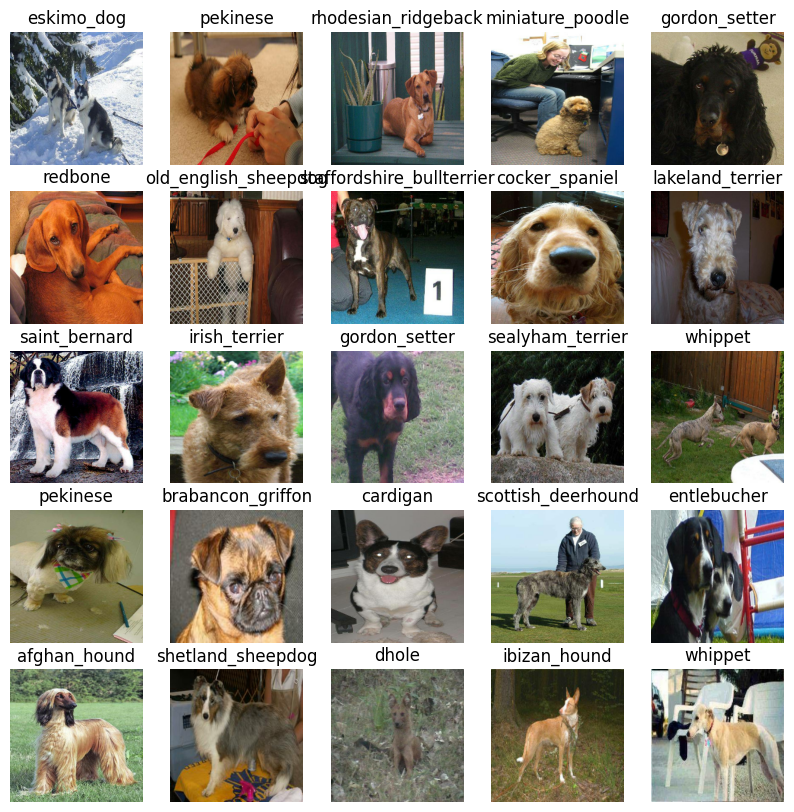

In [65]:
# Let's visualize the images and labels in the batch
show_25_images(train_images, train_labels)

# III. BUILD A MODEL
There are a few things we need to define:

*   The input shape (our images shape, in the form of Tensors to feed to the model)
*   The output shape (images labels, in the form of Tensors)
*   The URL of the model we want to use


## 1. DEFINE INPUT SHAPE, OUTPUT SHAPE

In [66]:
import tensorflow_hub as hub
# Set up input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # like the shape of our data batches: batch, height, width, color channels

# Set up output shape
OUTPUT_SHAPE = len(unique_breeds)



## 2. SELECT A SUITABLE MODEL ON TENSORFLOW HUB

In [67]:
# Setup model URL from TensorFlow Hub
#MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/035-128-classification/versions/2"
MODEL_URL = "https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1"

## 3. BUILD THE MODEL
Let's use the Keras API of TensorFlow.

Let's create a function which:
*   Takes the input shape, output shape and the chosen model as parameters
*   Defines the layers in a Keras model in a sequential fashion
*   Compiles the model
*   Builds the model (tell the model the input shape it'll be getting)
*   Returns the model


### 3.1 Create a function that builds a Keras model

In [68]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with: ', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") # Layer 2 (output layer), use "sigmoid" for binary classification
      ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalFocalCrossentropy(), # use BinaryFocalCrossentropy for binary classification
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)

  return model

### 3.2 Test it out

In [69]:
model = create_model()
model.summary()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_4 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


# IV. TRAIN THE MODEL


## 1. CREATE CALLBACKS
We will create Callbacks functions which are helper during training to:


*   Check progress
*   Save progress
*   Stop training early
*   etc.

We will create 2 Callbacks:


*   One for TensorBoard to track our model training progress
*   Another for early stopping



### 1.1 TensorBoard Callback
We'll need to do 3 things:


*   Load the TensorBoard notebook extension
*   Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's `fit()` function
*   Visualize our model training logs with the `%tensorboard` magic function



In [70]:
# Load TensorBoard notebook extension
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [71]:
import datetime
import os

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  log_dir = os.path.join("/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(log_dir)

### 1.2 Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stop improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [72]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stop if model stop improving after 3 epochs

## 2. TRAIN THE MODEL
Let's create a function which trains the model:


*   Create a model using `create_model()`
*   Setup a TensorBoard callback using `create_tensorboard_callback()`
*   Call the `fit()` function of the model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callback we'd like to use
*   Return the model



In [73]:
# Number of passes of data going through the layers
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}


In [74]:
# Check to make sure we are on GPU. This should be run on Colab L4
print('GPU: ', 'available (YES!)' if tf.config.list_physical_devices("GPU") else 'available (NO!)')

GPU:  available (YES!)


In [75]:
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create model
  model = create_model()

  # Create new TensorBoard session every we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model with the data, passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # validating every epoch/pass
            callbacks = [tensorboard, early_stopping])

  return model

In [76]:
# Fit the model to the data
model = train_model()

Building model with:  https://kaggle.com/models/google/mobilenet-v2/frameworks/TensorFlow2/variations/130-224-classification/versions/1
Epoch 1/100
200/200 [==============================] - 268s 1s/step - loss: 0.3438 - accuracy: 0.6023 - val_loss: 0.1427 - val_accuracy: 0.7613
Epoch 2/100
200/200 [==============================] - 11s 57ms/step - loss: 0.0574 - accuracy: 0.8838 - val_loss: 0.1376 - val_accuracy: 0.7600
Epoch 3/100
200/200 [==============================] - 11s 57ms/step - loss: 0.0225 - accuracy: 0.9480 - val_loss: 0.1306 - val_accuracy: 0.7675
Epoch 4/100
200/200 [==============================] - 11s 57ms/step - loss: 0.0098 - accuracy: 0.9767 - val_loss: 0.1336 - val_accuracy: 0.7738
Epoch 5/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0049 - accuracy: 0.9903 - val_loss: 0.1316 - val_accuracy: 0.7750
Epoch 6/100
200/200 [==============================] - 11s 56ms/step - loss: 0.0028 - accuracy: 0.9961 - val_loss: 0.1302 - val_accuracy: 0.

## 3. EVALUATE THE TRAINING WITH TENSORBOARD
Check the TensorBoard logs.<br>
The TensorBoard magic function (`%tensorboard`) will access the logs directory we created and visualize its contents.


In [78]:
%tensorboard --logdir /content/drive/My\Drive/AI/dog-breed-identification/dog-breed-data/logs

Output hidden; open in https://colab.research.google.com to view.

## 4. MAKE & TRANSFORM PREDICTIONS

### 4.1 Make manual predictions on the validation data (not used to train on)

In [79]:
# Let's see again what our val_data look like
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [80]:
predictions = model.predict(val_data, verbose=1)

50/50 [==============================] - 3s 46ms/step


In [81]:
predictions

array([[2.89460263e-06, 1.80052757e-05, 6.02185310e-07, ...,
        1.27492254e-04, 2.47400044e-03, 5.67717252e-05],
       [9.58990313e-06, 3.31677049e-02, 1.14395880e-04, ...,
        2.23211420e-04, 9.88034003e-07, 1.04606343e-05],
       [6.04641968e-07, 1.85953547e-06, 1.91929830e-05, ...,
        5.58142438e-06, 4.56515863e-06, 2.17332286e-06],
       ...,
       [1.81068447e-06, 3.41837840e-05, 4.30836144e-06, ...,
        9.00231025e-05, 3.08684743e-04, 8.49177286e-06],
       [3.89221583e-07, 8.36051368e-06, 3.04008654e-06, ...,
        1.03172915e-05, 2.50681285e-02, 2.02675324e-06],
       [3.17750411e-04, 5.40878573e-05, 3.24595703e-07, ...,
        1.98856142e-05, 2.94505327e-04, 1.13861097e-04]], dtype=float32)

In [82]:
predictions.shape # 1600 dog images, 120 breeds

(1600, 120)

In [83]:
# This is the prediction result for the first image in validation data
predictions[0] # 120 elements with probability of each corresponding to a breed, probabilities add up to 1

array([2.89460263e-06, 1.80052757e-05, 6.02185310e-07, 3.77281033e-03,
       6.42780242e-06, 1.04277915e-05, 5.02631556e-05, 3.06002516e-06,
       7.57737434e-05, 4.21273444e-06, 9.53114703e-02, 8.27162330e-06,
       3.76236858e-05, 4.06235813e-06, 5.10015866e-07, 9.04934423e-05,
       1.01804574e-06, 1.21042576e-04, 7.49775973e-06, 6.22726875e-05,
       1.67570452e-05, 1.36113101e-06, 1.90999958e-06, 1.96139008e-04,
       7.58824317e-05, 4.31759759e-07, 1.28885280e-04, 6.98954352e-07,
       5.15630608e-03, 8.41039673e-06, 1.23336133e-06, 6.25482935e-04,
       5.47109288e-04, 2.46616037e-05, 1.87676531e-04, 2.37699575e-03,
       3.62625747e-06, 6.18369722e-06, 1.07392611e-06, 9.80982659e-05,
       6.48438145e-05, 2.99011099e-05, 3.92646871e-06, 1.65069760e-05,
       4.13778616e-06, 7.07908976e-06, 1.56203043e-06, 6.96764182e-05,
       9.86055093e-05, 2.47848238e-05, 3.74515434e-06, 6.82736413e-07,
       1.80960124e-05, 1.28457628e-04, 5.74473097e-06, 1.63018971e-03,
      

In [84]:
# Let's have a quick look at the probability of this first prediction
index = 0
print(predictions[index])
print(f"Max value (probability): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
#print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")
print(f"Predicted label:  {unique_breeds[np.argmax(predictions[index])]}")


[2.89460263e-06 1.80052757e-05 6.02185310e-07 3.77281033e-03
 6.42780242e-06 1.04277915e-05 5.02631556e-05 3.06002516e-06
 7.57737434e-05 4.21273444e-06 9.53114703e-02 8.27162330e-06
 3.76236858e-05 4.06235813e-06 5.10015866e-07 9.04934423e-05
 1.01804574e-06 1.21042576e-04 7.49775973e-06 6.22726875e-05
 1.67570452e-05 1.36113101e-06 1.90999958e-06 1.96139008e-04
 7.58824317e-05 4.31759759e-07 1.28885280e-04 6.98954352e-07
 5.15630608e-03 8.41039673e-06 1.23336133e-06 6.25482935e-04
 5.47109288e-04 2.46616037e-05 1.87676531e-04 2.37699575e-03
 3.62625747e-06 6.18369722e-06 1.07392611e-06 9.80982659e-05
 6.48438145e-05 2.99011099e-05 3.92646871e-06 1.65069760e-05
 4.13778616e-06 7.07908976e-06 1.56203043e-06 6.96764182e-05
 9.86055093e-05 2.47848238e-05 3.74515434e-06 6.82736413e-07
 1.80960124e-05 1.28457628e-04 5.74473097e-06 1.63018971e-03
 4.02057867e-06 3.75281699e-04 4.44239668e-05 4.68866841e-04
 2.68493568e-05 3.58168181e-05 6.16512182e-07 2.75114580e-05
 1.68405371e-04 1.643588

### 4.2 Transform Predictions To Text
This help compare the predicted label and the true label

In [86]:
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)] # just like above

get_pred_label(predictions[0])

'lakeland_terrier'

In [87]:
# Our validation data is still in a batch: val_data
# Create a function to unbatch the dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels
  """
  images = []
  labels = []
  # Loop though unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

In [88]:
# Unbatch val_data
val_images, val_labels = unbatchify(val_data)

# V. VISUALIZE & EVALUATE PREDICTIONS


## 1. VISUALIZE PREDICTIONS
Let's create a function which:

*   Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer
*   Convert the prediction probabilities to a predicted label
*   Plot the predicted label, its predicted probability, the truth label and the image on a single plot.



In [89]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred label
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probability and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color=color)

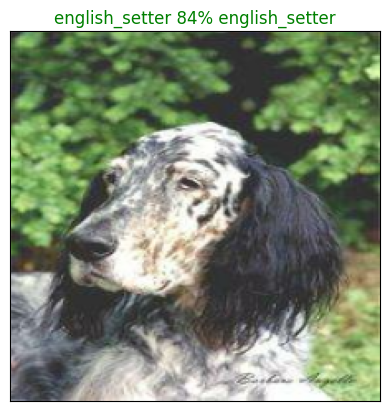

In [90]:
# Let's try it out
plot_pred(prediction_probabilities=predictions, labels=val_labels, images=val_images, n=1)

## 2. SHOW THE TOP 10 RESULT OF A PREDICTION
Make a function that will:


*   Take an input of prediction probabilities array, a ground truth array and an integer
*   Find the prediction using `get_pred_label()`
*   Find the top 10
*   Plot the top 10 altogether






In [91]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  pred_prob, true_label = prediction_probabilities[n], val_labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1] # [::-1] -> reverse the array

  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]

  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color="grey")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

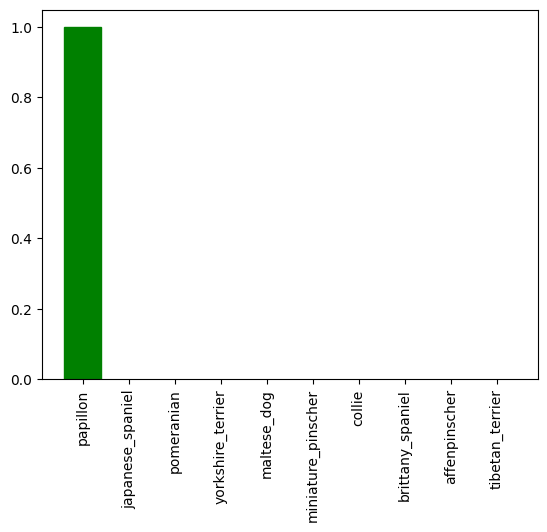

In [92]:
plot_pred_conf(prediction_probabilities=predictions, labels=val_labels, n=42)

## 3. SHOW IMAGES SIDE BY SIDE

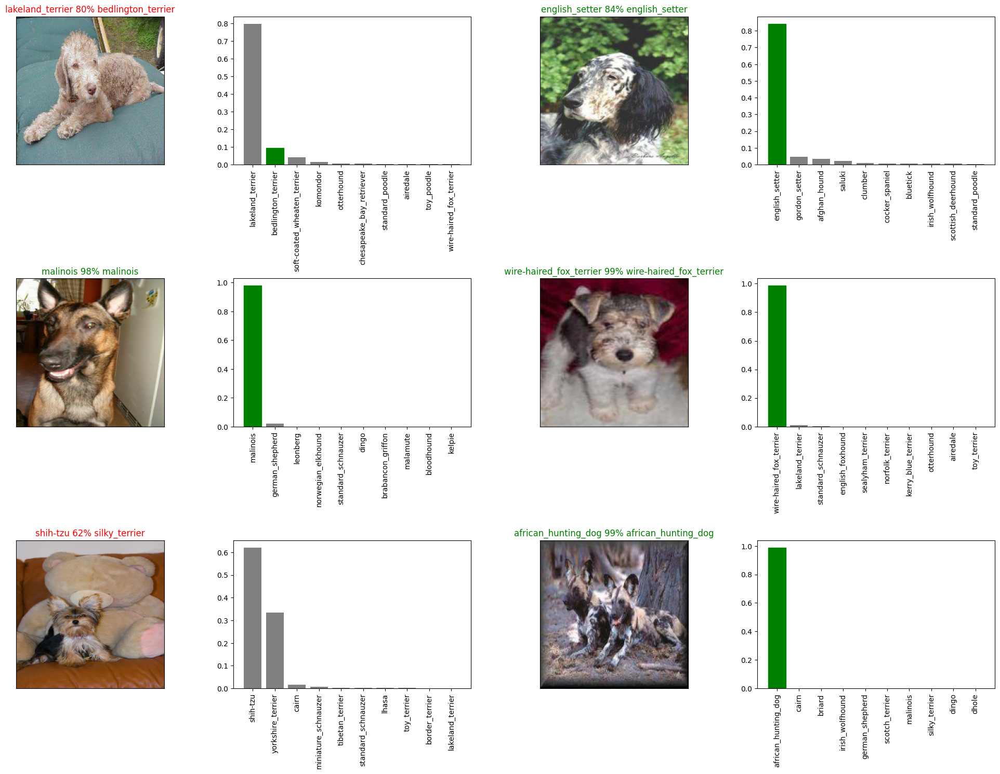

In [93]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols

plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range (num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

# VI. SAVE & LOAD THE TRAINED MODEL

## 1. SAVE MODEL
Let's create a function.

In [94]:
def save_model(model, suffix=None):
  """
  Save a given model in a model directory and append a suffix string
  """
  # Create a model directory pathname with current time
  model_dir = os.path.join("/content/drive/MyDrive/AI/dog-breed-identification/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = model_dir + "-" + suffix + ".h5"
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

## 2. LOAD MODEL
Let's also create a function.

In [95]:
def load_model(model_path):
  print(f"Loading saved model from: {model_path}...")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

## 3. TEST IT OUT

In [97]:
# Save our model trained on 8000 images
save_model(model, suffix="8000-images-mobinetv2-Adam")

Saving model to: /content/drive/MyDrive/AI/dog-breed-identification/models/20240608-02281717813718-8000-images-mobinetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/AI/dog-breed-identification/models/20240608-02281717813718-8000-images-mobinetv2-Adam.h5'

In [98]:
# Load the model
loaded_8000_image_model = load_model('/content/drive/MyDrive/AI/dog-breed-identification/models/20240608-02281717813718-8000-images-mobinetv2-Adam.h5')

Loading saved model from: /content/drive/MyDrive/AI/dog-breed-identification/models/20240608-02281717813718-8000-images-mobinetv2-Adam.h5...


# V. PREDICTION ON TEST DATASET AND SUBMISSION

## 1. PREPARE THE TEST DATASET
The test dataset must first be in the same format and the train dataset. So let's to the followings:
* Get the test images filenames
* Convert filenames into test data batches using `create_data_batches`

In [100]:
# Load images filenames
test_path = "/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[0]

'/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/ea3dd88512f22e94969a517e8e8ea10e.jpg'

In [101]:
len(test_filenames)

10357

In [102]:
# Create data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [103]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

## 2. MAKE PREDICTIONS ON THE TEST DATASET

In [104]:
test_predictions = loaded_8000_image_model.predict(test_data, verbose=1)

324/324 [==============================] - 666s 2s/step


In [107]:
# Save predictions to csv file
np.savetxt('/content/drive/My Drive/AI/dog-breed-identification/predictions_array.csv', test_predictions, delimiter=",")

In [108]:
# Load predictions back from csv file
loaded_predictions = np.loadtxt('/content/drive/My Drive/AI/dog-breed-identification/predictions_array.csv', delimiter=",")

In [109]:
loaded_predictions.shape

(10357, 120)

## 3. PREPARE DATA FOR SUBMISSION
Kaggle's format requirement: For each image in the test set, you must predict a probability for each of the different breeds. Our predictions must be arranged in a dataframe with an ID column and a column for each dog breed.

We will create a pandas DataFrame in this format and fill it with relevant data extracted from the predictions.

In [110]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))

In [112]:
preds_df.shape

(0, 121)

In [113]:
# Let's see again what is in test_filenames
test_filenames[:5]

['/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/ea3dd88512f22e94969a517e8e8ea10e.jpg',
 '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/e83d7fa8fdfba0ec577f9c8df811d439.jpg',
 '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/f4a3d9cf1909fb5d894ff5d5121af9b0.jpg',
 '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/ec036cf752a803815c0e8ecc6601b0e3.jpg',
 '/content/drive/My Drive/AI/dog-breed-identification/dog-breed-data/test/efd7266343c00fd2cb3cf5aec4aa0b42.jpg']

In [116]:
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:5]

['ea3dd88512f22e94969a517e8e8ea10e',
 'e83d7fa8fdfba0ec577f9c8df811d439',
 'f4a3d9cf1909fb5d894ff5d5121af9b0',
 'ec036cf752a803815c0e8ecc6601b0e3',
 'efd7266343c00fd2cb3cf5aec4aa0b42']

In [117]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ea3dd88512f22e94969a517e8e8ea10e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e83d7fa8fdfba0ec577f9c8df811d439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,f4a3d9cf1909fb5d894ff5d5121af9b0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ec036cf752a803815c0e8ecc6601b0e3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,efd7266343c00fd2cb3cf5aec4aa0b42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [118]:
# Add the probabilities for each breed
preds_df[list(unique_breeds)] = loaded_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,ea3dd88512f22e94969a517e8e8ea10e,0.000003,1.333121e-06,0.000031,0.000011,1.589598e-05,2.199835e-07,0.040587,4.774400e-06,5.893888e-06,...,3.831369e-06,6.312811e-05,1.079769e-06,9.378863e-07,0.000007,1.065253e-04,1.642891e-03,1.342824e-06,3.515763e-05,8.654752e-02
1,e83d7fa8fdfba0ec577f9c8df811d439,0.000064,9.927100e-05,0.000008,0.000047,7.887057e-05,6.019004e-06,0.000025,1.813100e-06,1.550538e-05,...,4.517069e-05,1.608829e-06,5.499226e-04,2.682310e-05,0.000018,6.374285e-04,4.725812e-06,8.893696e-06,4.262820e-06,9.966696e-05
2,f4a3d9cf1909fb5d894ff5d5121af9b0,0.000009,4.592104e-07,0.000002,0.000002,8.451791e-06,9.324906e-06,0.000013,1.152411e-08,5.264120e-07,...,8.380698e-07,2.556092e-06,2.515710e-06,2.683049e-06,0.000043,6.022788e-08,3.963548e-05,1.632727e-04,1.010387e-05,2.579242e-08
3,ec036cf752a803815c0e8ecc6601b0e3,0.000011,5.730673e-05,0.000051,0.000114,4.015282e-05,3.037698e-06,0.000003,2.065733e-07,4.919690e-06,...,2.196941e-07,5.401453e-07,5.518439e-07,7.037402e-07,0.000002,2.177219e-06,7.025113e-08,5.832059e-05,2.144263e-07,9.290962e-06
4,efd7266343c00fd2cb3cf5aec4aa0b42,0.000200,2.145964e-06,0.000012,0.000015,2.410857e-07,7.988879e-06,0.000297,6.493798e-06,9.926315e-07,...,3.003713e-05,9.328864e-03,2.812743e-05,8.287540e-05,0.000018,1.427850e-06,4.952446e-05,5.474298e-07,7.089277e-05,8.731688e-04


In [120]:
# Export CSV
preds_df.to_csv('/content/drive/My Drive/AI/dog-breed-identification/submission1.csv', index=False)